<a href="https://colab.research.google.com/github/MLDavies/capstone-computer-vision/blob/main/YOLOv5_russian_military_vehicles.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Folder structure**

Object detection requires a specific folder structure. For YOLOv5, the directory tree is generally:

          |- workingdir
            |-- yolov5
              |--test
                |--images
                |--labels
              |-- train
                |--images
                |-- labels
              |-- valid
                |-- images
                |-- labels
            



## Steps:

        1. Install YOLOv5 and dependencies
        2. Download data (from my Github)
        3. Write Training configuration
          * finetuning
            - hyperparameters
            - data augmentation
          * model architectures (yaml)
            - two models
        4. Train both models
        5. Evaluate performance
          * Visualize evalution metrics
          * Visualize training data
          * Run "validation" on test images (for confusion matrix)
        6. Run inference on test images
          * With ensembled model (boosting)
          * Implement test time augmentation (TTA)
        7. Run inference on video
          * With ensembled model
          * Implement test time augmentation (TTA)
        8. Export saved weights for future inference
        



## Cloning Data and YOLOv5 Repos

**YOLOv5 repo**

In [ ]:
!git clone https://github.com/MLDavies/yolov5.git
%cd yolov5
#!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 13071, done.
remote: Total 13071 (delta 0), reused 0 (delta 0), pack-reused 13071
Receiving objects: 100% (13071/13071), 12.47 MiB | 30.26 MiB/s, done.
Resolving deltas: 100% (8977/8977), done.
/content/yolov5


**Data**

In [ ]:
!git clone https://github.com/MLDavies/russian-military-vehicles-annotated.git
%cd /content/yolov5/russian-military-vehicles-annotated
!unzip -q /content/yolov5/russian-military-vehicles-annotated/Russian-military-annotated.v2-2022-04-25-rebalance-t-v-t-split.yolov5pytorch.zip -d /content/yolov5/

Cloning into 'russian-military-vehicles-annotated'...
remote: Enumerating objects: 93, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 93 (delta 1), reused 1 (delta 0), pack-reused 88
Unpacking objects: 100% (93/93), done.
/content/yolov5/russian-military-vehicles-annotated


## Take a look at one training image

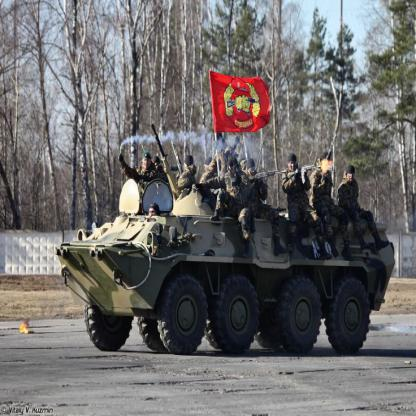

In [ ]:
import glob
from IPython.display import Image, display

Image(filename = "/content/yolov5/train/images/10_jpg.rf.ebaf4ec56e87211ac2aaf61a1f41cfd6.jpg")

#Install Dependencies

Remember to choose GPU in Runtime 

In [ ]:
# install dependencies as necessary
# On a local machine, will likely need pytorch, pyyaml (not yaml), tqdm and more
import os

!pip install -qr /content/yolov5/requirements.txt  # install dependencies (ignore errors)
# !pip install -r requirements.txt wandb # install (add W&B for logging)
import torch

from IPython.display import Image, clear_output  # to display images
#from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 8.0 MB/s 
Setup complete. Using torch 1.12.0+cu113 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


### Set up the data YAML config file

In [ ]:
# this is the preloaded YAML file wrote during the annotation process
%cd /content/yolov5
%cat data.yaml

/content/yolov5
train: ../train/images
val: ../valid/images

nc: 10
names: ['bm-21', 'bmd-2', 'bmp-1', 'bmp-2', 'btr-70', 'btr-80', 'mt-lb', 't-64', 't-72', 't-80']

In [ ]:
# change folder address in yaml file
# With help from Akeem Wells (https://www.akeemjwells.com/)
f1 = open("data.yaml", 'r')
f2 = open("new_data.yaml", 'w')
for line in f1.readlines():
  if "../" in line:
    line = line.replace("../", "/content/yolov5/")
  f2.write(line)

f2.close()
f1.close()

os.rename("data.yaml", "old_data.yaml")
os.rename("new_data.yaml", "data.yaml")

%cat data.yaml

train: /content/yolov5/train/images
val: /content/yolov5/valid/images

nc: 10
names: ['bm-21', 'bmd-2', 'bmp-1', 'bmp-2', 'btr-70', 'btr-80', 'mt-lb', 't-64', 't-72', 't-80']

In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

num_classes

'10'

# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

### Hyperparameter Selection



In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/data/hyps/hyp.custom.yaml

# high augmentation
lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.1  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.3  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 0.7  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.1  # image translation (+/- fraction)
scale: 0.9  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.1  # image mixup (probability)
copy_paste: 0.1  # segment copy-paste (probability)

# Model 1 - YOLOvs (small model)

**Model Archecture**

In [ ]:
%%writetemplate /content/yolov5/models/custom-yolov5s.yaml

# Parameters
nc: num_classes  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Model 2 YOLOv5l (large model)
- same hyperparameters

In [ ]:
%%writetemplate /content/yolov5/models/custom-yolov5l.yaml

# Parameters
nc: num_classes  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

Here, we are able to pass a number of arguments:
- **img:** define input image size (best with multiples of 32. Better results with 1280, for instance)
- **batch:** determine batch size (min 32, bigger is better)
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights.
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

### Train small YOLOv5

In [ ]:
# time its performance 
%%time
!python train.py --img 640 --batch 16 --epochs 150 --data data.yaml\
  --weights yolov5s.pt\
  --hyp hyp.custom.yaml\
  --cfg custom-yolov5s.yaml\
  --name v5s_results

# --cache    --project 'runs_vehicles' --img 832 --optimizer Adam

train: weights=yolov5s.pt, cfg=custom-yolov5s.yaml, data=data.yaml, hyp=hyp.custom.yaml, epochs=150, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=v5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/MLDavies/yolov5 ✅
YOLOv5 🚀 v6.1-316-g916bdb1 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv

### Train large YOLOv5

In [ ]:
%%time
!python train.py --img 640 --batch 16 --epochs 150 --data data.yaml\
  --weights yolov5l.pt\
  --hyp hyp.custom.yaml\
  --cfg custom-yolov5l.yaml\
  --name v5l_results

train: weights=yolov5l.pt, cfg=custom-yolov5l.yaml, data=data.yaml, hyp=hyp.custom.yaml, epochs=150, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=v5l_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/MLDavies/yolov5 ✅
YOLOv5 🚀 v6.1-316-g916bdb1 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv

# Evaluate Custom YOLOv5 Detector Performance

**mAP**

The computer vision community has converged on the Mean Average Precision ("mAP") metric to compare the performance of object detection systems. Object detection models make predictions in terms of a bounding box and a class label. First, The Intersection over Union (IoU) measures as the amount of predicted bounding box that overlaps with the ground truth bounding box divided by the total area of both bounding boxes. Next, it calculates the average precision (AP) for each class individually across all of the IoU thresholds. Then the metric averages the mAP for all classes to arrive at the final estimate. ([J. Solawetz, 2020](https://blog.roboflow.com/mean-average-precision/))

**Box Loss, Objectness Loss and Classification Loss**

mAP will generally show the inverse shape of the loss. There are three different types of loss shown here: box loss, objectness loss and classification loss. ([M. Kasper-Eulaers, 2021](https://www.researchgate.net/publication/350540629_Short_Communication_Detecting_Heavy_Goods_Vehicles_in_Rest_Areas_in_Winter_Conditions_Using_YOLOv5))
- The box loss represents how well the algorithm can locate the centre of an object and how well the predicted bounding box covers an object. 

- Objectness is essentially a measure of the probability that an object exists in a proposed region of interest. If the objectivity is high, this means that the image window is likely to contain an object. 

- Classification loss gives an idea of how well the algorithm can predict the correct class of a given object.

**Assessment of our model**

The model improved swiftly in terms of precision, recall and mean average precision before plateauing after about 100 epochs. The box, objectness and classification losses of the validation data also showed a rapid decline until around epoch 100. YOLOv5 automatically saves the best weights/model.

**Extract and plot the evaluation/performance metrics:**

In [ ]:
# Load packages
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Read in eval data for each model, merge, and 
# create df's metrics for both models on one plot
s_metrics = pd.read_csv('/content/yolov5/runs/train/v5s_results/results.csv')\
  .add_suffix("_s")\
  .rename(columns={'               epoch_s':'epoch'})
l_metrics = pd.read_csv('/content/yolov5/runs/train/v5l_results/results.csv')\
  .add_suffix("_l")\
  .rename(columns={'               epoch_l':'epoch'})

cols_pivot_s = list(s_metrics.columns)[1:]
cols_pivot_l = list(l_metrics.columns)[1:]

s_metrics_long = s_metrics.melt(id_vars='epoch', value_vars = cols_pivot_s,
                  var_name = 'model', value_name = 'metric')

l_metrics_long = l_metrics.melt(id_vars='epoch', value_vars = cols_pivot_l,
                  var_name = 'model', value_name = 'metric')

metrics_long = s_metrics_long.append(l_metrics_long).reset_index()
metrics_long['model'] = metrics_long['model'].str.lstrip()
metrics_long['metric'] = metrics_long['metric'].round(3)

train_box = metrics_long.query("model.str.contains('train/box')", engine='python')
train_obj = metrics_long.query("model.str.contains('train/obj')", engine='python')
train_cls = metrics_long.query("model.str.contains('train/cls')", engine='python')
val_box = metrics_long.query("model.str.contains('val/box')", engine='python')
val_obj = metrics_long.query("model.str.contains('val/obj')", engine='python')
val_cls = metrics_long.query("model.str.contains('val/cls')", engine='python')
prec = metrics_long.query("model.str.contains('precision')", engine='python')
rec = metrics_long.query("model.str.contains('recall')", engine='python')
mAP = metrics_long.query("model.str.contains('mAP_0.5_')", engine='python')

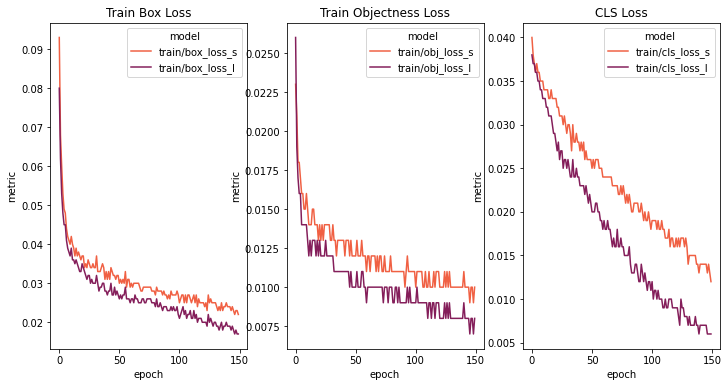

In [ ]:
#plot metrics
from matplotlib import rcParams

rcParams['figure.figsize'] = 12,6
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharey=False)

palette = sns.color_palette("rocket_r", 2)
sns.lineplot(data=train_box, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax1)\
    .set(title='Train Box Loss');

sns.lineplot(data=train_obj, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax2)\
    .set(title='Train Objectness Loss');

sns.lineplot(data=train_cls, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax3)\
    .set(title='CLS Loss');

from google.colab import files
plt.savefig("/content/yolov5/runs/loss_metrics.png")
#files.download("abc.png") 

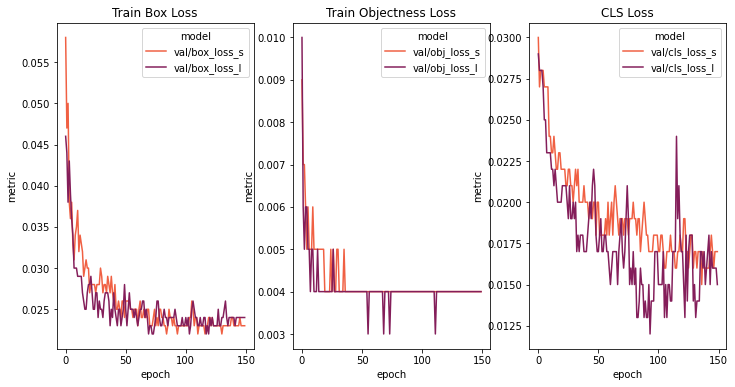

In [ ]:
rcParams['figure.figsize'] = 12,6
fig, (ax4, ax5, ax6) = plt.subplots(ncols=3, sharey=False)
sns.lineplot(data=val_box, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax4)\
    .set(title='Train Box Loss')

sns.lineplot(data=val_obj, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax5)\
    .set(title='Train Objectness Loss')

sns.lineplot(data=val_cls, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax6)\
    .set(title='CLS Loss');

plt.savefig("/content/yolov5/runs/loss_metrics2.png")

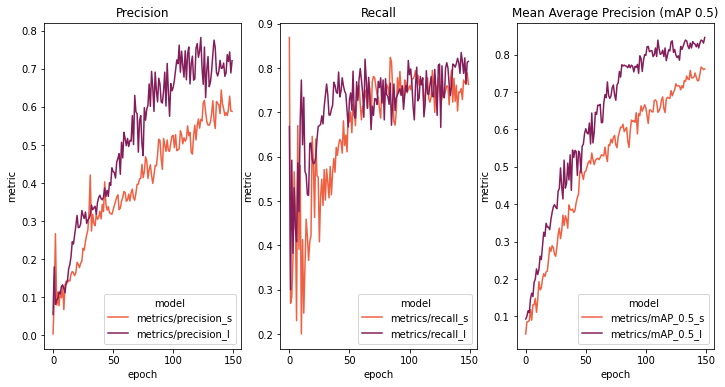

In [ ]:
rcParams['figure.figsize'] = 12,6
fig, (ax7, ax8, ax9) = plt.subplots(ncols=3, sharey=False)
sns.lineplot(data=prec, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax7)\
    .set(title='Precision')

sns.lineplot(data=rec, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax8)\
    .set(title='Recall')

sns.lineplot(data=mAP, x='epoch', y='metric', 
             hue='model', palette = palette, ax=ax9)\
    .set(title='Mean Average Precision (mAP 0.5)');

plt.savefig("/content/yolov5/runs/accuracy_metrics.png")

### Visualize Our Training Data with Labels

GROUND TRUTH TRAINING DATA:


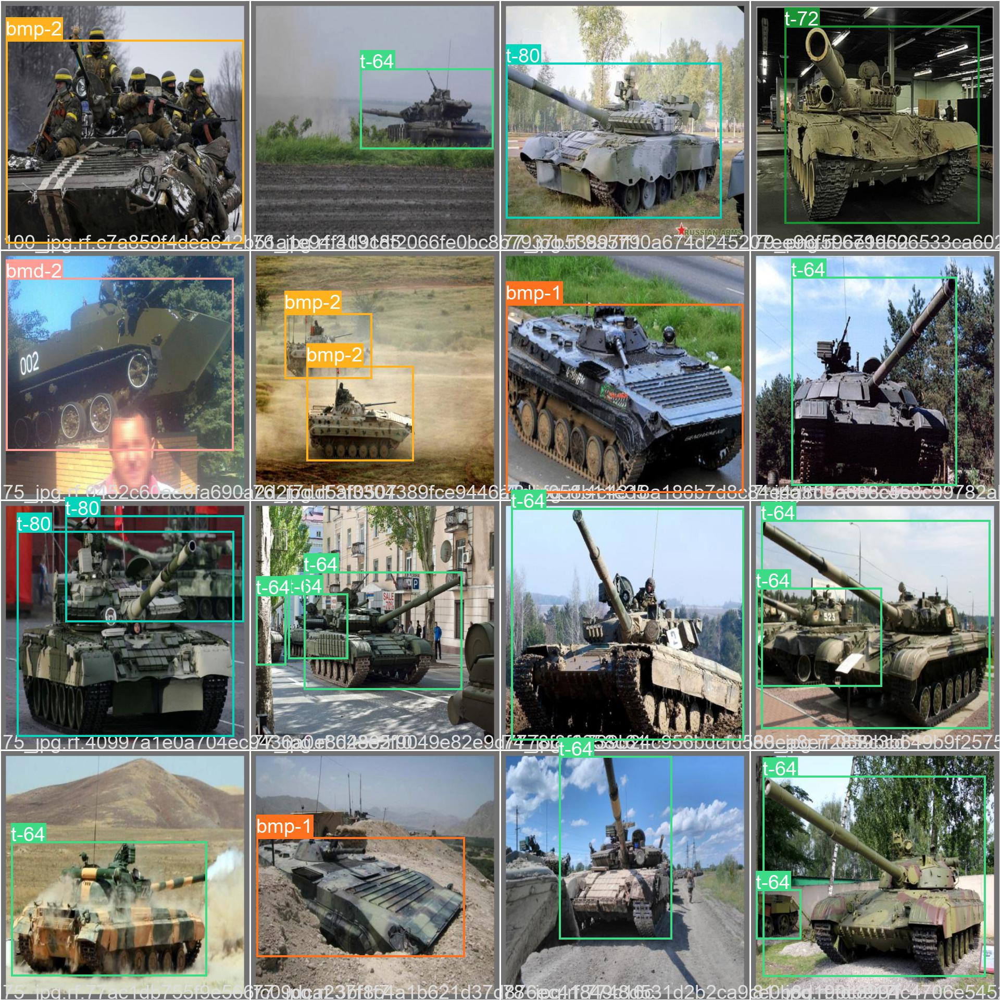

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/v5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


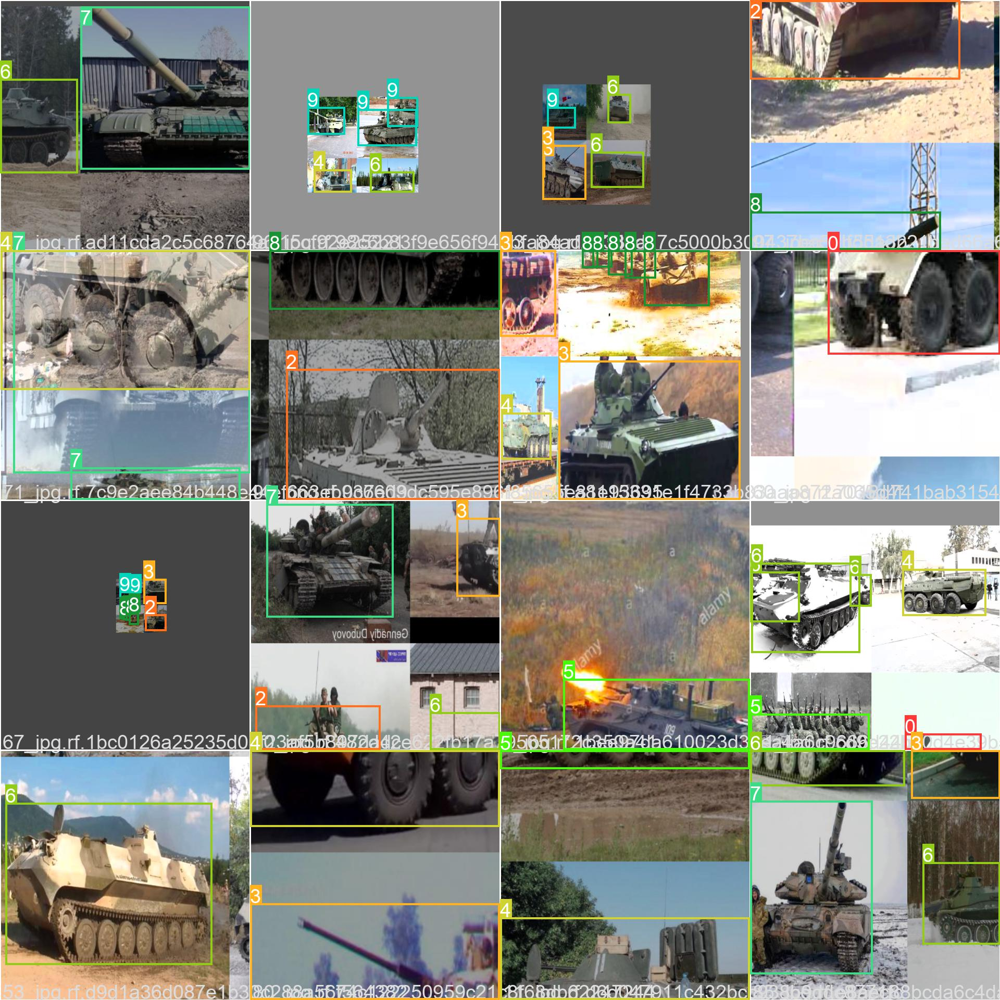

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/v5l_results/train_batch0.jpg', width=900)

## Confusion Matrix for the training with the YOLOv5l (large model)

The heatmap shows a strong diagonal line suggestion good over all performance. Notably, some vehicles were harder to identify, such as the t-64, t-72, btr-70, and btr-80.

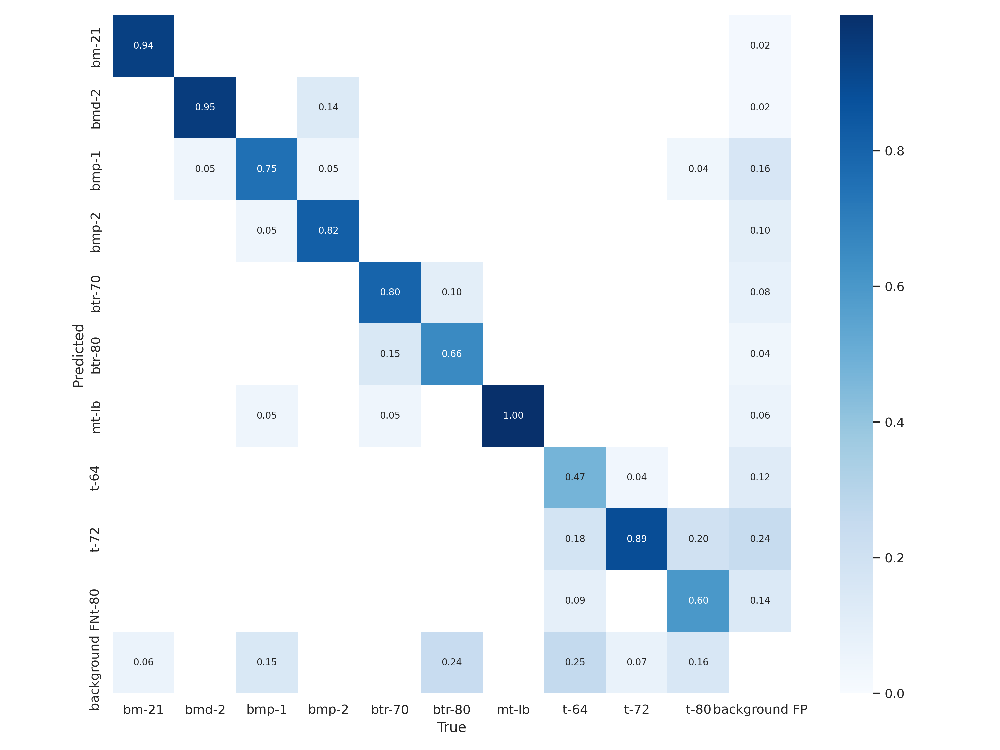

In [ ]:
Image(filename="/content/yolov5/runs/train/v5l_results/confusion_matrix.png", width = 1000, height = 600)

# Validate by testing on unseen data

- With TTA and ensembled YOLOv5s and YOLOv5l

In [ ]:
# create validation yaml
%%writetemplate /content/yolov5/data-val.yaml

train: /content/yolov5/train/images
val: /content/yolov5/test/images

nc: 10
names: ['bm-21', 'bmd-2', 'bmp-1', 'bmp-2', 'btr-70',
        'btr-80', 'mt-lb', 't-64', 't-72', 't-80']

In [ ]:
# Validate with large model
!python /content/yolov5/val.py --weights /content/yolov5/runs/train/v5l_results/weights/best.pt\
  --data /content/yolov5/data-val.yaml\
  --img 832\
  --augment

#Validate with ensembled model
!python /content/yolov5/val.py --weights /content/yolov5/runs/train/v5l_results/weights/best.pt /content/yolov5/runs/train/v5s_results/weights/best.pt\
  --data /content/yolov5/data-val.yaml\
  --img 832\
  --augment

# --conf 0.001 --iou 0.65\
# --half', action='store_true', help='use FP16 half-precision inference')

val: data=/content/yolov5/data-val.yaml, weights=['/content/yolov5/runs/train/v5l_results/weights/best.pt'], batch_size=32, imgsz=832, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=True, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-316-g916bdb1 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom-YOLOv5l summary: 367 layers, 46156743 parameters, 0 gradients, 107.8 GFLOPs
val: Scanning '/content/yolov5/test/labels' images and labels...100 found, 0 missing, 0 empty, 0 corrupt: 100% 100/100 [00:00<00:00, 983.32it/s]
val: New cache created: /content/yolov5/test/labels.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 4/4 [00:07<00:00,  1.86s/it]
                 all        100        120      0.905      0.808      0.877      0.747
      

## Confusion matrix on final hold-out/inference data.

As expected, there is a slight decrease in performance with the same struggles in identifying some vehicles types.

However, we can also see that there is substantial better performance with the ensembled model.

**Confusion matrix for large model**

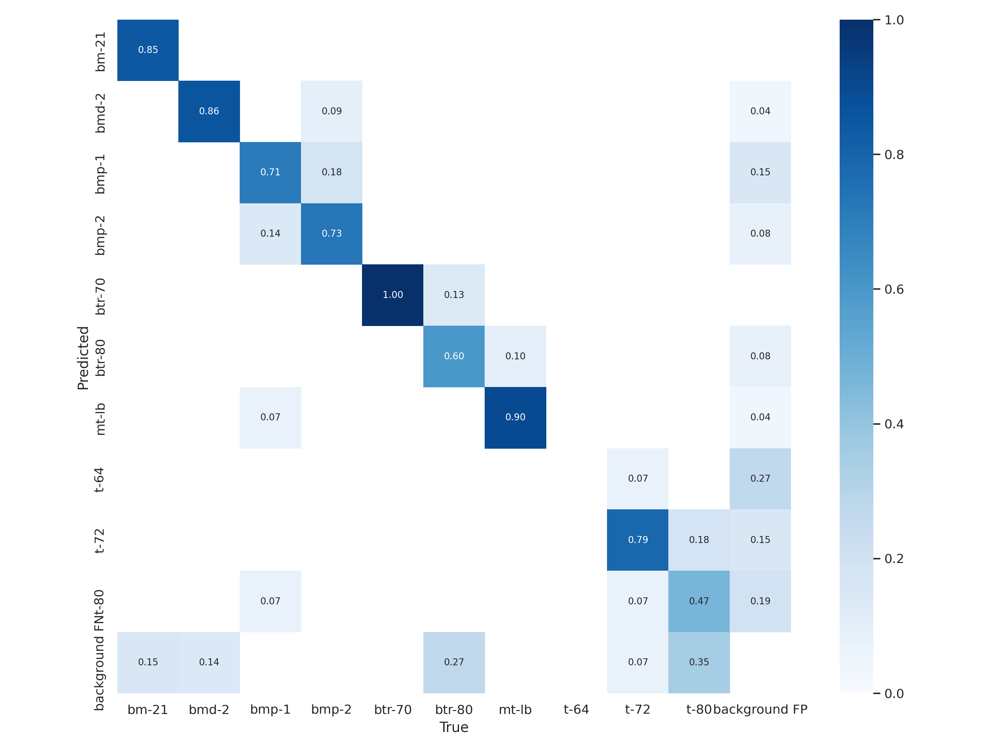

In [ ]:
Image(filename="/content/yolov5/runs/val/exp/confusion_matrix.png", width = 1000, height = 600)

**Confusion matrix for ensembled model**

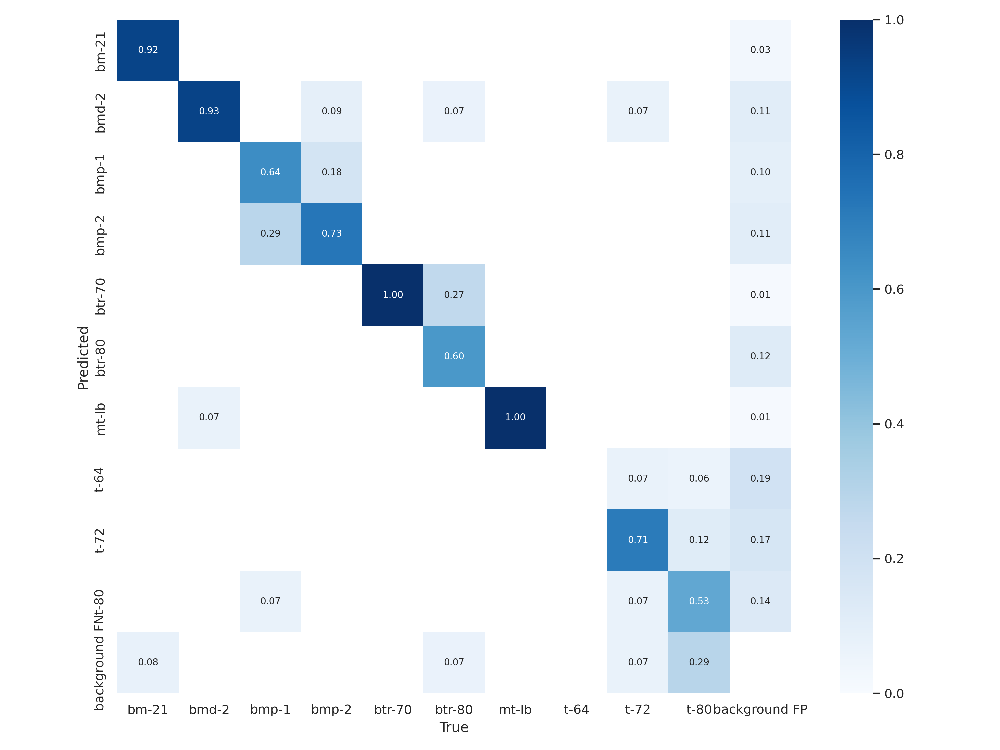

In [ ]:
Image(filename="/content/yolov5/runs/val/exp2/confusion_matrix.png", width = 1000, height = 600)

# Now use the final model to locate and classify (with bounding boxes)

* Predicting on the final hold-out set (with TTA and ensembling)

In [ ]:
# notice the inference time. 
# detect.py use the best weights to test on test images/video
# increase img size 30% with --augment
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/v5l_results/weights/best.pt /content/yolov5/runs/train/v5s_results/weights/best.pt\
  --img 820\
  --conf 0.3\
  --source /content/yolov5/test/images\
  --augment\
  --visualize

/content/yolov5
detect: weights=['/content/yolov5/runs/train/v5l_results/weights/best.pt', '/content/yolov5/runs/train/v5s_results/weights/best.pt'], source=/content/yolov5/test/images, data=data/coco128.yaml, imgsz=[820, 820], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=True, visualize=True, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-316-g916bdb1 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom-YOLOv5l summary: 367 layers, 46156743 parameters, 0 gradients, 107.8 GFLOPs
Fusing layers... 
custom-YOLOv5s summary: 213 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
Ensemble created with ['/content/yolov5/runs/train/v5l_results/weights/best.pt', '/content/yolov5/runs/train/v5s_results/weights/best.p

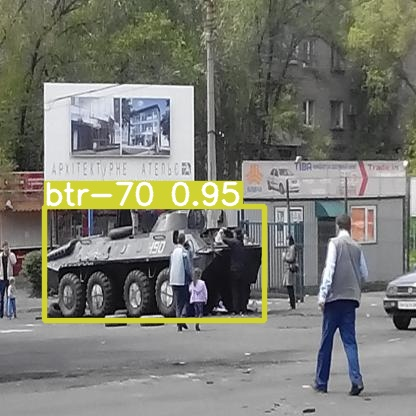

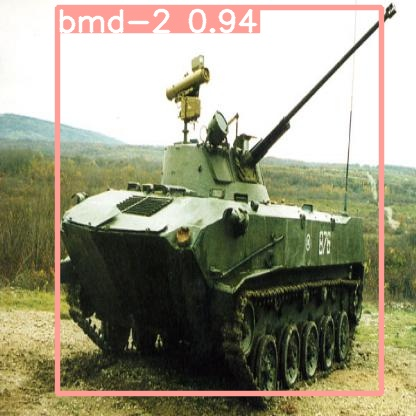

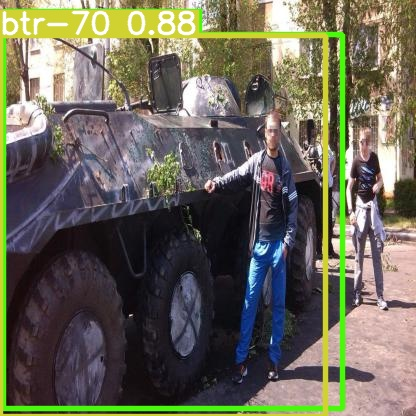

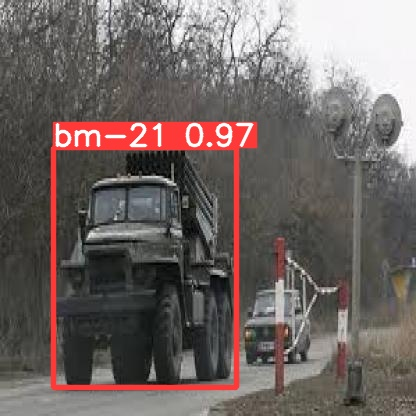

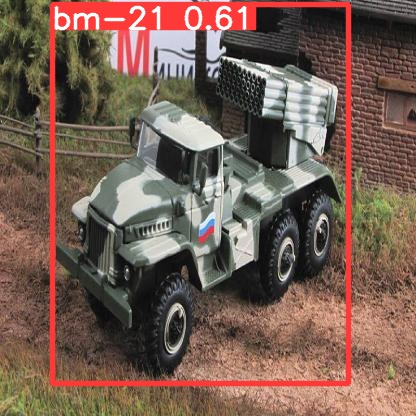

...

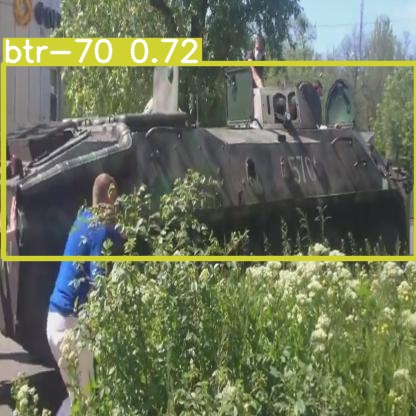

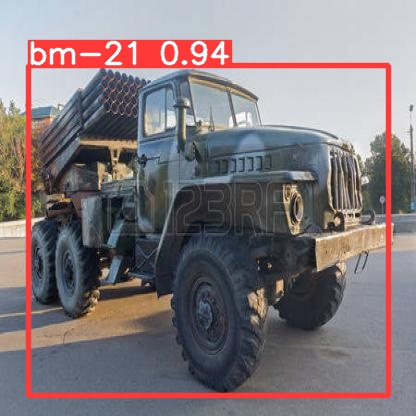

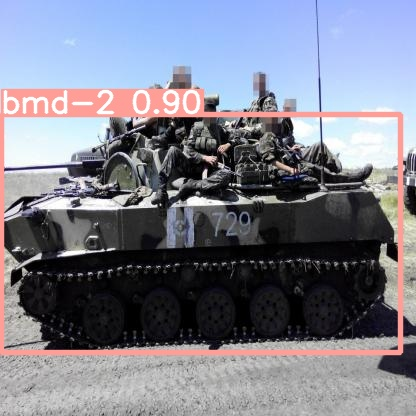

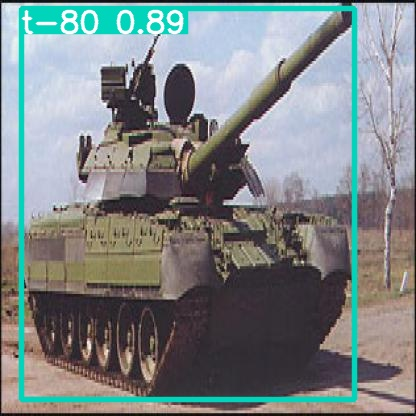

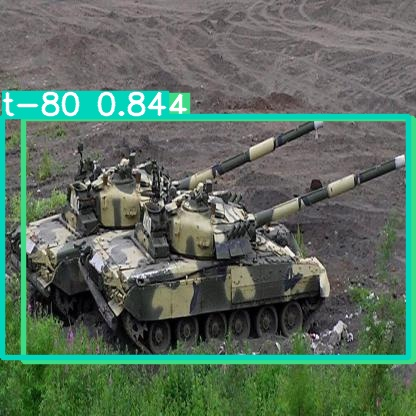

In [ ]:
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Detect on video by URL

In [ ]:
# !pip install pafy
# !pip install youtube_dl
# !pip uninstall -y pafy
# !pip install youtube-dl==2020.12.2

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/v5l_results/weights/best.pt /content/yolov5/runs/train/v5s_results/weights/best.pt\
  --img 416 --conf 0.3\
  --source https://youtu.be/-7nKPpb8rEk\
  --augment

# long no much https://www.youtube.com/watch?v=MyBoXnDvGH0
# Russian convoy - no logos https://videos.dailymail.co.uk/video/mol/2022/02/22/1537992909869071522/640x360_MP4_1537992909869071522.mp4

detect: weights=['/content/yolov5/runs/train/v5l_results/weights/best.pt', '/content/yolov5/runs/train/v5s_results/weights/best.pt'], source=https://youtu.be/-7nKPpb8rEk, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=True, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-528-gd11fc06 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom-YOLOv5l summary: 367 layers, 46156743 parameters, 0 gradients, 107.8 GFLOPs
Fusing layers... 
custom-YOLOv5s summary: 213 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
Ensemble created with ['/content/yolov5/runs/train/v5l_results/weights/best.pt', '/content/yolov5/runs/train/v5s_results/weights/best.pt']

cv2.imsho

# Export result

Save to google drive:  
- results from all experiments (evaluation data and images)
- final/best model for future inference


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
/content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/best-model-v5l

Mounted at /content/gdrive


In [ ]:
# copy train results
%cp -r /content/yolov5/runs/train/v5l_results/*.jpg /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results
%cp -r /content/yolov5/runs/train/v5l_results/*.png /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results
%cp -r /content/yolov5/runs/train/v5l_results/*.csv /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results
%cp -r /content/yolov5/runs/train/v5s_results/*.jpg /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results
%cp -r /content/yolov5/runs/train/v5s_results/*.png /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results
%cp -r /content/yolov5/runs/train/v5s_results/*.csv /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results

# copy train metrics
%cp -r /content/yolov5/runs/*.png /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/train-results

# copy val.py results on unseen data
%cp -r /content/yolov5/runs/val/exp/*.jpg /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/val-large-cm
%cp -r /content/yolov5/runs/val/exp2/*.jpg /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/val-ensemble-cm
%cp -r /content/yolov5/runs/val/exp/*.png /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/val-large-cm
%cp -r /content/yolov5/runs/val/exp2/*.png /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/val-ensemble-cm

# copy final hold out images
%cp -r /content/yolov5/runs/detect/exp/*.jpg /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/hold-out-predictions

# video
%cp -r /content/yolov5/runs/detect/exp2/-7nKPpb8rEk.mp4 /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs

# save best.pt for future inference
%cp -r /content/yolov5/runs/train/v5l_results/weights/best.pt /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/best-model-v5l
%cp -r /content/yolov5/runs/train/v5s_results/weights/best.pt /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs/best-model-v5s

In [ ]:
# copy feature maps

#%cp -r /content/yolov5/runs/detect/exp3/100_png.rf.a5a49d0908d14aa33ec781cea2690730/*png /content/gdrive/MyDrive/Colab_Notebooks/yolo-model-outputs

In [ ]:
!pip list

Package                       Version
----------------------------- ------------------------------
absl-py                       1.1.0
alabaster                     0.7.12
albumentations                0.1.12
altair                        4.2.0
appdirs                       1.4.4
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arviz                         0.12.1
astor                         0.8.1
astropy                       4.3.1
astunparse                    1.6.3
atari-py                      0.2.9
atomicwrites                  1.4.0
attrs                         21.4.0
audioread                     2.1.9
autograd                      1.4
Babel                         2.10.2
backcall                      0.2.0
beautifulsoup4                4.6.3
bleach                        5.0.0
blis                          0.7.7
bokeh                         2.3.3
branca                        0.5.0
bs4                           0.0.1
CacheControl                  0.